In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.spatial.distance import *

sc.settings.set_figure_params(dpi=80)


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


# functions

In [2]:
def build_inverse_map(li):
    li_len = len(li)
    idx_range = range(li_len)
    rst = [(li[i],i) for i in idx_range]
    
    return dict(rst)

# HDST

## BC

In [3]:
path_name = '/home/yzy/PUBDT/st/HDST/brain/'
file_name = 'CN13_D2_unmodgtf_filtered_red_ut_segments_final.tsv'
adata_meta = sc.read_csv(path_name+file_name,delimiter='\t',dtype='str',first_column_names=True)

In [4]:
adata_meta.shape

(246231, 8)

In [5]:
adata_meta.var_names

Index(['bc', 'spot_px_x', 'spot_px_y', 'gene', 'count', 'segment_id',
       'segment_px_x', 'segment_px_y'],
      dtype='object')

In [6]:
unique_genes = np.array(np.unique(adata_meta[:,'gene'].X))
unique_segments = np.array(np.unique(adata_meta[:,'segment_id'].X))
# unique_spots = np.unique(np.array(adata_meta.obs_names))
unique_spots = np.array(np.unique(adata_meta[:,'bc'].X))

In [7]:
gene_idx_map = build_inverse_map(unique_genes)
segment_idx_map = build_inverse_map(unique_segments)
spot_idx_map = build_inverse_map(unique_spots)

spot_spatial_map = {}
segment_spatial_map = {}

In [8]:
spots_X = np.zeros(shape=(len(unique_spots),len(unique_genes)))
segments_X = np.zeros(shape=(len(unique_segments),len(unique_genes)))

In [10]:
len(unique_segments)

33749

In [11]:
var_names_list = np.array(adata_meta.var_names)
bc_idx = np.where(var_names_list=='bc')[0][0]

spot_px_x_idx = np.where(var_names_list=='spot_px_x')[0][0]
spot_px_y_idx = np.where(var_names_list=='spot_px_y')[0][0]
gene_idx = np.where(var_names_list=='gene')[0][0]
count_idx = np.where(var_names_list=='count')[0][0]
segment_id_idx = np.where(var_names_list=='segment_id')[0][0]
segment_px_x_idx = np.where(var_names_list=='segment_px_x')[0][0]
segment_px_y_idx = np.where(var_names_list=='segment_px_y')[0][0]


In [12]:
spot_px_x_idx

1

In [13]:
var_names_list = np.array(adata_meta.var_names)
bc_idx = np.where(var_names_list=='bc')[0][0]

spot_px_x_idx = np.where(var_names_list=='spot_px_x')[0][0]
spot_px_y_idx = np.where(var_names_list=='spot_px_y')[0][0]
gene_idx = np.where(var_names_list=='gene')[0][0]
count_idx = np.where(var_names_list=='count')[0][0]
segment_id_idx = np.where(var_names_list=='segment_id')[0][0]
segment_px_x_idx = np.where(var_names_list=='segment_px_x')[0][0]
segment_px_y_idx = np.where(var_names_list=='segment_px_y')[0][0]




for i in range(adata_meta.shape[0]):
    cur_spot_name = adata_meta.X[i,bc_idx]
    cur_spot_spatial = [float(adata_meta.X[i,spot_px_x_idx]), float(adata_meta.X[i,spot_px_y_idx])]
    cur_gene = adata_meta.X[i,gene_idx]
    cur_gene_count = int(adata_meta.X[i,count_idx])
    cur_segment_name = adata_meta.X[i,segment_id_idx]
    cur_segment_spatial = [float(adata_meta.X[i,segment_px_x_idx]), float(adata_meta.X[i,segment_px_y_idx])]
    
    spot_insert_idx = spot_idx_map[cur_spot_name]
    gene_insert_idx = gene_idx_map[cur_gene]
    segment_insert_idx = segment_idx_map[cur_segment_name]
    
    spots_X[spot_insert_idx,gene_insert_idx] += cur_gene_count
    segments_X[segment_insert_idx,gene_insert_idx] += cur_gene_count
    
    spot_spatial_map[cur_spot_name] = cur_spot_spatial
    segment_spatial_map[cur_segment_name] = cur_segment_spatial
    
    if i%10000==0:
        print(i)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000


In [14]:
obs_spot = pd.DataFrame(index=unique_spots)
obs_segment = pd.DataFrame(index=unique_segments)
var = pd.DataFrame(index=unique_genes)
# var_name must be str


adata_spot = ad.AnnData(spots_X,  obs=obs_spot,var=var, dtype='float32')
adata_segment = ad.AnnData(segments_X,  obs=obs_segment,var=var, dtype='float32')

In [15]:
spot_spatial_mat = [spot_spatial_map[spot] for spot in unique_spots]
segment_spatial_mat = [segment_spatial_map[segment] for segment in unique_segments]

spot_spatial_mat = np.array(spot_spatial_mat)
segment_spatial_mat = np.array(segment_spatial_mat)

In [16]:
adata_spot.obsm['spatial'] = spot_spatial_mat
adata_segment.obsm['spatial'] = segment_spatial_mat

In [21]:
np.max(adata_spot.X,axis=0)[100]

2.0

In [20]:
np.max(adata_segment.X,axis=0)[100]

2.0

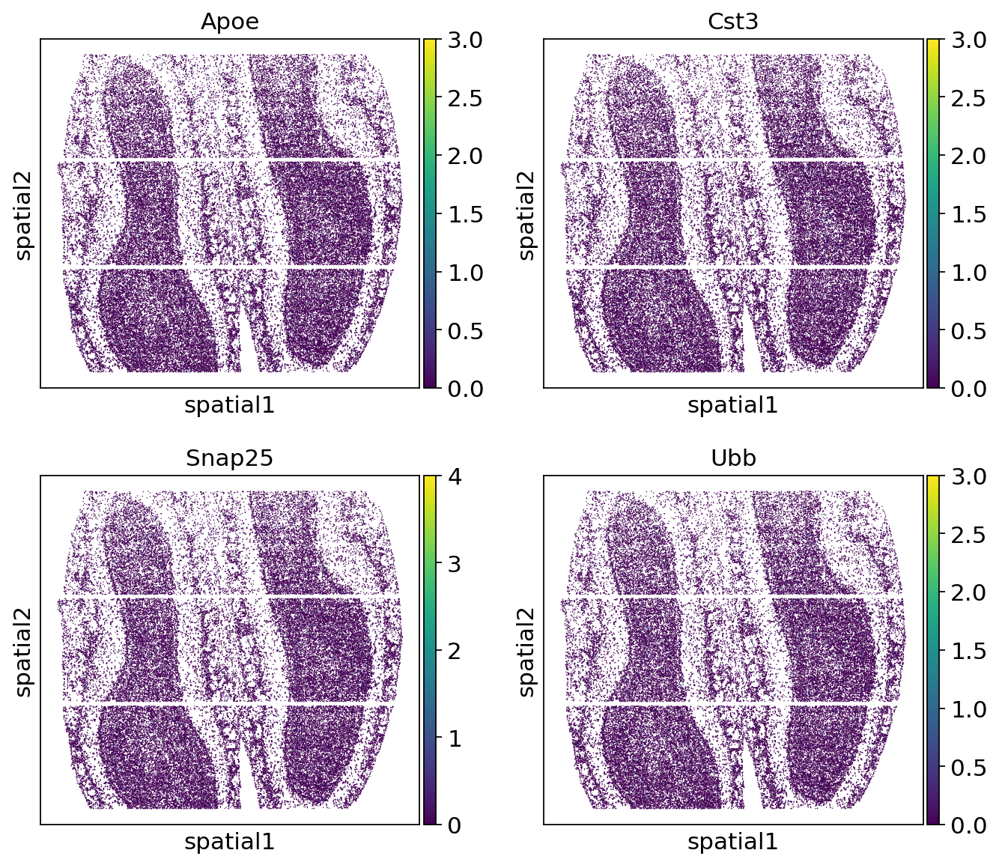

In [29]:
sc.pl.embedding(adata_spot,color=['Apoe','Cst3','Snap25','Ubb'],
               basis='spatial',ncols=2,)

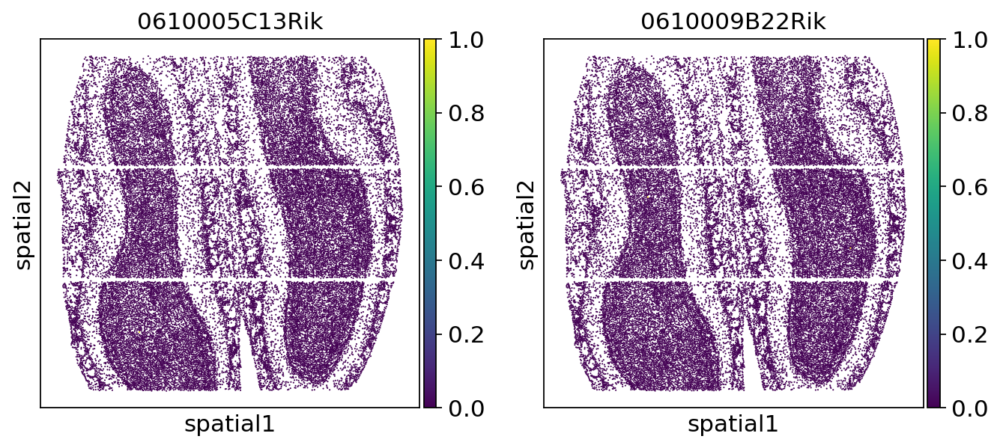

In [35]:
sc.pl.embedding(adata_segment,color=['0610005C13Rik','0610009B22Rik'],
               basis='spatial',ncols=2)

In [38]:
adata_spot.shape

(76344, 14910)

In [37]:
adata_segment.shape

(33749, 14910)

In [25]:
np.sum(adata_segment.var_names.str.startswith("mt-"))

33

In [26]:
adata_segment.var["mt"] = adata_segment.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata_segment, qc_vars=["mt"], inplace=True)

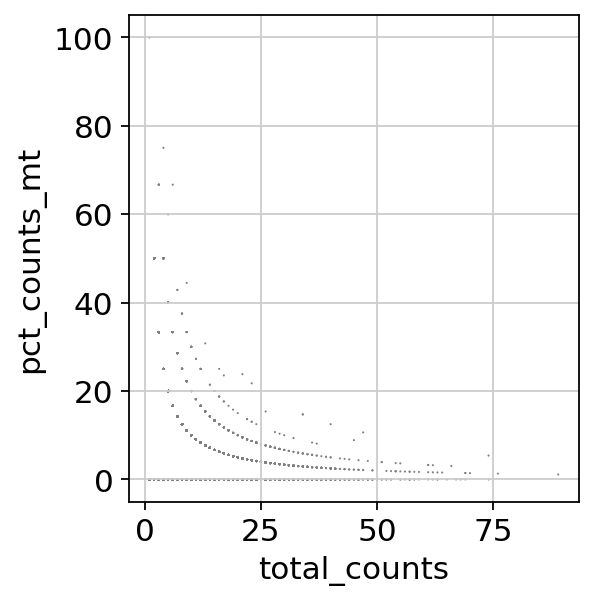

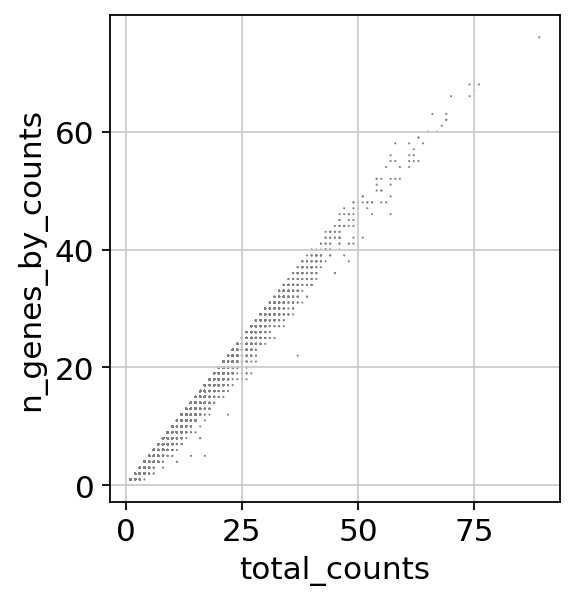

In [27]:
sc.pl.scatter(adata_segment, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata_segment, x='total_counts', y='n_genes_by_counts')

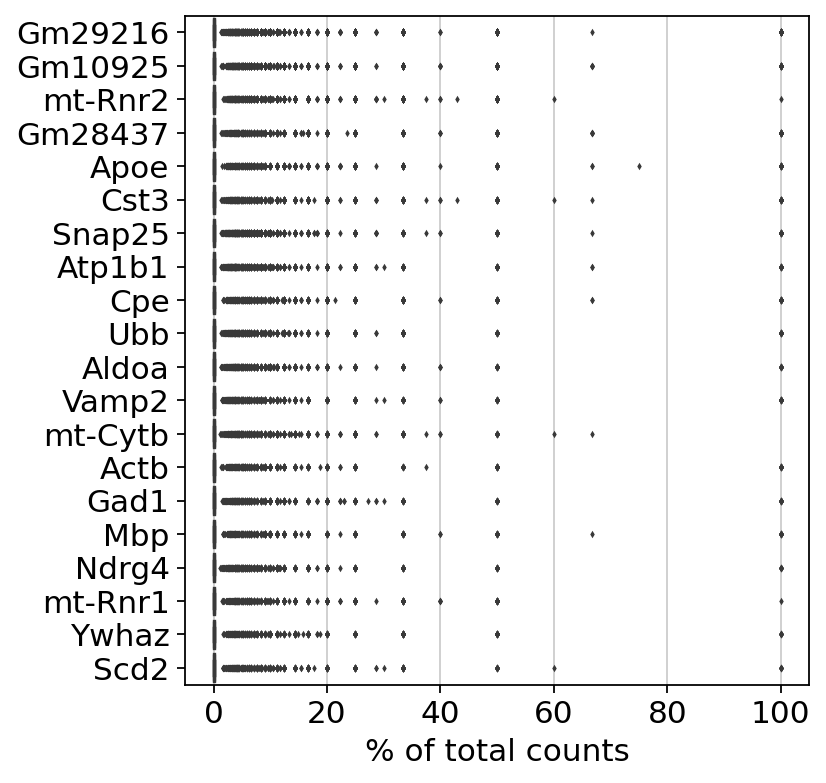

In [28]:
sc.pl.highest_expr_genes(adata_segment, n_top=20, )

In [45]:
adata_segment_tmp = adata_segment.copy()

In [49]:
adata_segment = adata_segment_tmp.copy()

In [50]:
sc.pp.filter_cells(adata_segment, min_genes=10)
sc.pp.filter_genes(adata_segment, min_cells=3)

In [53]:
adata = adata_segment
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=1000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/e

In [58]:
adata.var_names

Index(['0610009L18Rik', '0610010F05Rik', '0610012G03Rik', '0610030E20Rik',
       '0610037L13Rik', '1110004F10Rik', '1110008P14Rik', '1110018N20Rik',
       '1110032A03Rik', '1110038F14Rik',
       ...
       'mt-Tf', 'mt-Th', 'mt-Tl1', 'mt-Tl2', 'mt-Tm', 'mt-Tn', 'mt-Tp',
       'mt-Tq', 'mt-Tv', 'mt-Tw'],
      dtype='object', length=8676)

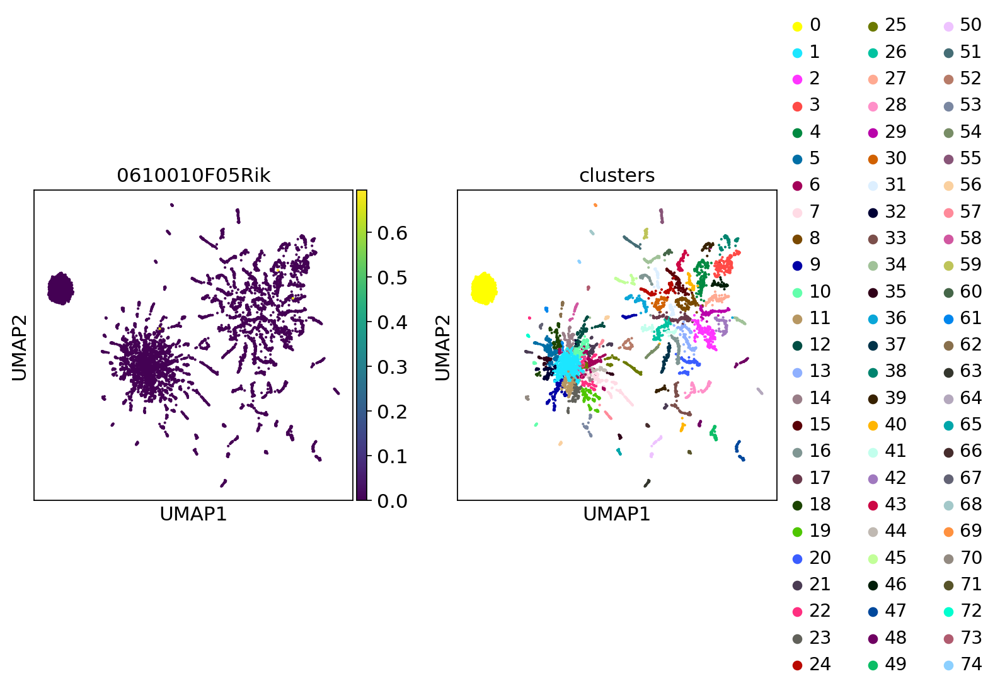

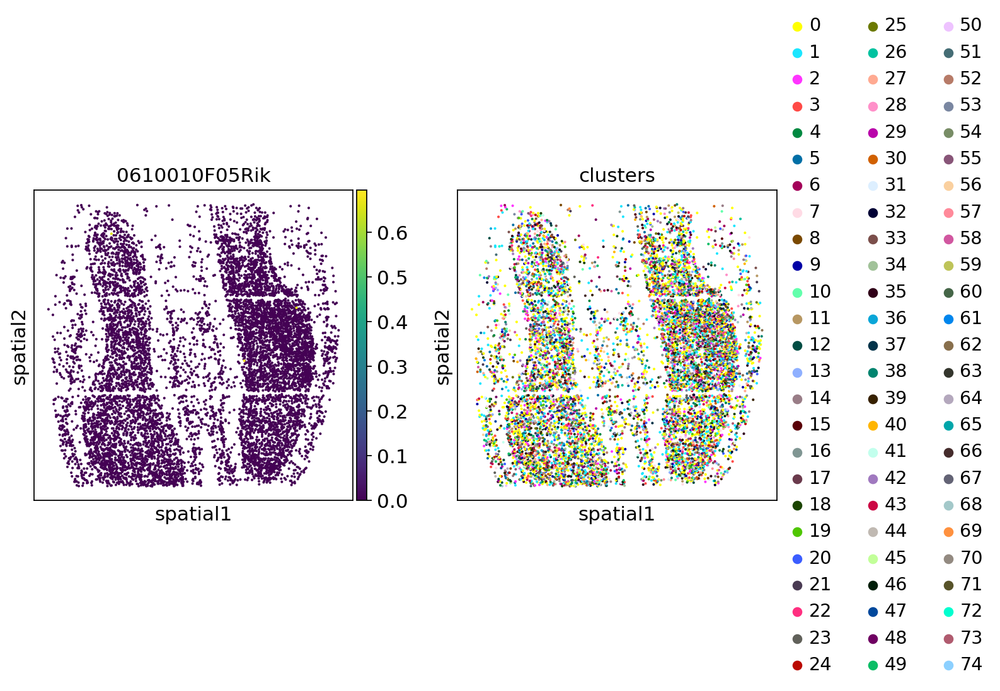

In [59]:
sc.pl.umap(adata,color=['0610010F05Rik','clusters'])
sc.pl.embedding(adata,basis='spatial',color=['0610010F05Rik','clusters'])


In [51]:
adata_segment_tmp.shape

(33749, 14910)

In [52]:
adata_segment.shape

(8798, 8676)

# Transcriptome-scale

In [46]:
path_name = '/home/yzy/PUBDT/st/seqFISH/Transcriptome-scale/'
pos_file_name = 'cortex_svz_cellcentroids.csv'
count_file_name = 'cortex_svz_counts.matrix'
adata_pos = sc.read_csv(path_name+pos_file_name,delimiter='\t',dtype='str')
adata_count = sc.read_csv(path_name+count_file_name,delimiter='\t',dtype='str')

In [91]:
adata_count_fieldofview = adata_count['Field_of_View',:].X[0,:]
adata_count_cellid = np.array(adata_count['Cell_ID',:].X[0,:])
obs = pd.DataFrame(index=np.arange(adata_count.shape[1]))
adata_count_X = adata_count[2:,:].X
adata_count_vars = pd.DataFrame(index=adata_count.obs_names[2:])
adata = ad.AnnData(np.transpose(adata_count_X),  obs=obs,var=adata_count_vars, dtype='float32')
adata.obs['cell_id'] = adata_count_cellid
adata.obs['field_of_view'] = adata_count_fieldofview
adata.obsm['spatial'] = np.array(adata_pos[:,['X','Y']].X,dtype='float')

Transforming to str index.


In [94]:
np.unique(adata.obs['field_of_view'])

array(['0', '1', '2', '3', '4', '5', '6'], dtype=object)

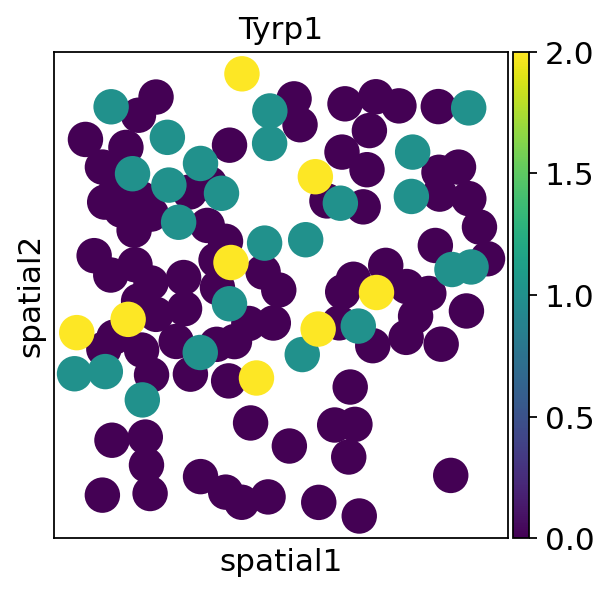

In [95]:
adata_plot = adata[adata.obs['field_of_view']=='0']
sc.pl.embedding(adata_plot,basis='spatial',color='Tyrp1')

# Heart development

## sc

In [99]:
# meta file有问题，有些莫名其妙的换行
meta_content = ''
prev_line = ''
meta_file = 'all_cells_meta_data_filtered.tsv'

i=0
with open(file_path+'meta.tsv','w') as fw:
    with open(file_path+meta_file,'r') as fr:
        for line in fr:
            line_wo_n = line[0:-1]
            
            if i==0:
                meta_content+=line_wo_n
                i+=1
                continue
            if line_wo_n.startswith('A') or line_wo_n.startswith('T') or line_wo_n.startswith('G') or line_wo_n.startswith('C'):
                meta_content+='\n'
                meta_content+=line_wo_n
            else:
                meta_content+=line_wo_n
    fw.write(meta_content)
                

In [100]:
file_path = '/home/yzy/PUBDT/st/Spatial_transcriptomics/A_Spatiotemporal/Developmental_heart_scRNA-seq/share_files/'
count_file = 'all_cells_count_matrix_filtered.tsv'
# meta_file = 'all_cells_meta_data_filtered.tsv'
meta_file = 'meta.tsv'
adata_heart_sc = sc.read_csv(file_path+count_file,delimiter='\t').transpose()
adata_heart_sc_meta = sc.read_csv(file_path+meta_file,delimiter='\t',dtype='str')

In [101]:
for var_name in adata_heart_sc_meta.var_names:
    cur_column = np.array(adata_heart_sc_meta[:,var_name].X)[:,0]
    adata_heart_sc.obs[var_name] = cur_column
    adata_heart_sc.obs[var_name] = adata_heart_sc.obs[var_name].astype('category')

In [104]:
adata_heart_sc.write('/home/yzy/PUBDT/st/Spatial_transcriptomics/A_Spatiotemporal/h5ad/sc.h5ad')

## st

In [105]:
st_path = '/home/yzy/PUBDT/st/Spatial_transcriptomics/A_Spatiotemporal/Developmental_heart_ST/share_files_ST/'
st_count_file = 'filtered_spots_count_matrix_all_weeks.tsv'
st_meta_file = 'filtered_spots_meta_data_all_weeks.tsv'
adata_heart_st = sc.read_csv(st_path+st_count_file,delimiter='\t').transpose()
adata_heart_st_meta = sc.read_csv(st_path+st_meta_file,delimiter='\t',dtype='str')

In [106]:
for var_name in adata_heart_st_meta.var_names:
    cur_column = np.array(adata_heart_st_meta[:,var_name].X)[:,0]
    adata_heart_st.obs[var_name] = cur_column
    adata_heart_st.obs[var_name] = adata_heart_st.obs[var_name].astype('category')

In [107]:
adata_heart_st

AnnData object with n_obs × n_vars = 3111 × 14014 
    obs: 'nGene', 'nUMI', 'Sample', 'weeks', 'ChipBatch', 'ChipNr', 'Experiment_date', 'Experiment_procedure', 'Sequencing_date', 'Raw_reads', 'new_x', 'new_y', 'percent.mito', 'res.0.8'

In [108]:
adata_heart_st.write('/home/yzy/PUBDT/st/Spatial_transcriptomics/A_Spatiotemporal/h5ad/st.h5ad')

# Spatial_detection

In [188]:
data_name = 'Individual3_RAA_R2'
path_name = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Spatial_detection/'
# idx_name = 'Individual1_LV_R1.idx'
idx_name = data_name+'.idx'

count_name = data_name+'.newcount'
adata_idx = sc.read_csv(path_name+idx_name,delimiter='\t',dtype='str')
adata_count = sc.read_csv(path_name+count_name,delimiter='\t',dtype='str')


In [189]:
count_X = np.array(adata_count[:,adata_count.var_names[1:]].X,dtype='float')
gene_list = adata_count[:,'gene'].X[:,0]
spot_list = adata_count.var_names[1:]
obs = pd.DataFrame(index=spot_list)
var = pd.DataFrame(index=gene_list)
adata = ad.AnnData(np.transpose(count_X),  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.transpose(adata_idx.X).astype('float')

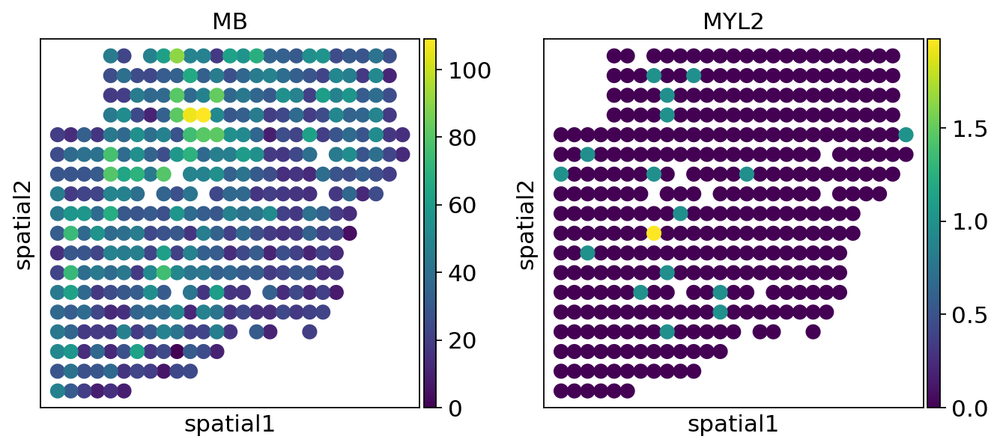

In [190]:
sc.pl.embedding(adata,basis='spatial',color=['MB','MYL2'])

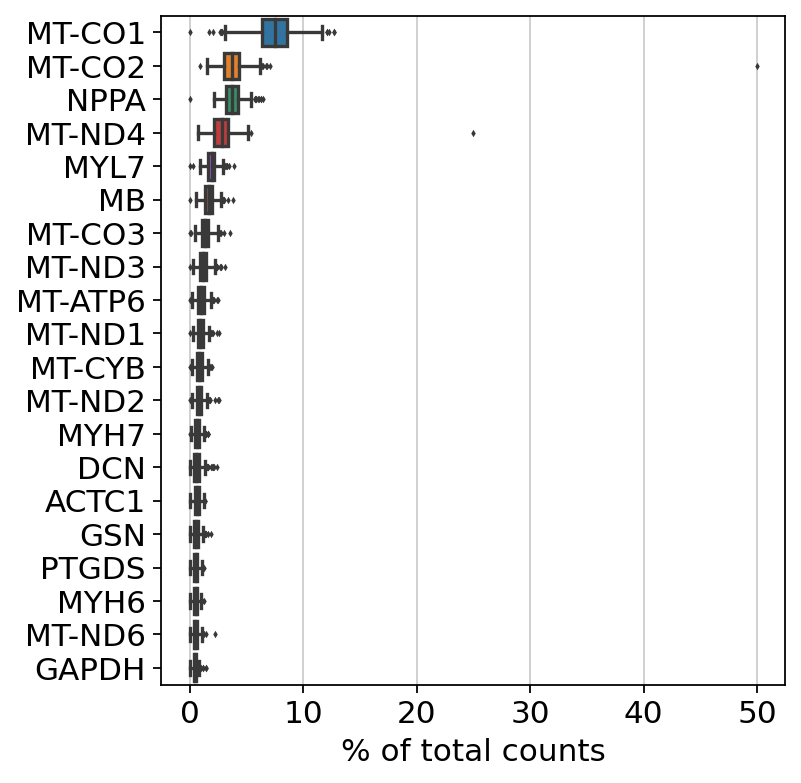

In [191]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [192]:
to_save_path = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Spatial_detection/h5ad/'
to_save_file = to_save_path+data_name+'.h5ad'
adata.write(to_save_file)

# spatial maps

In [250]:
data_name = 'P4.3'
path_name = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Spatial_maps/'
# idx_name = 'Individual1_LV_R1.idx'
idx_name = data_name+'.idx'

count_name = data_name+'.count'
adata_idx = sc.read_csv(path_name+idx_name,delimiter='\t',dtype='str')
adata_count = sc.read_csv(path_name+count_name,delimiter='\t',dtype='str')


In [251]:
count_X = np.array(adata_count[:,adata_count.var_names[1:]].X,dtype='float')
gene_list = adata_count[:,'gene'].X[:,0]
spot_list = adata_count.var_names[1:]
obs = pd.DataFrame(index=spot_list)
var = pd.DataFrame(index=gene_list)
adata = ad.AnnData(np.transpose(count_X),  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.transpose(adata_idx.X).astype('float')

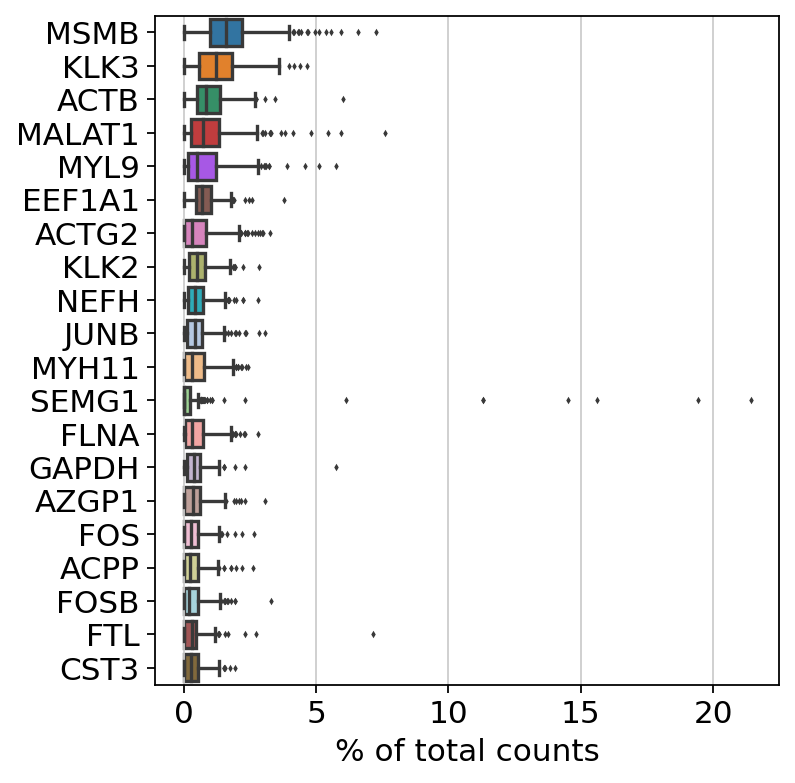

In [252]:
sc.pl.highest_expr_genes(adata, n_top=20, )

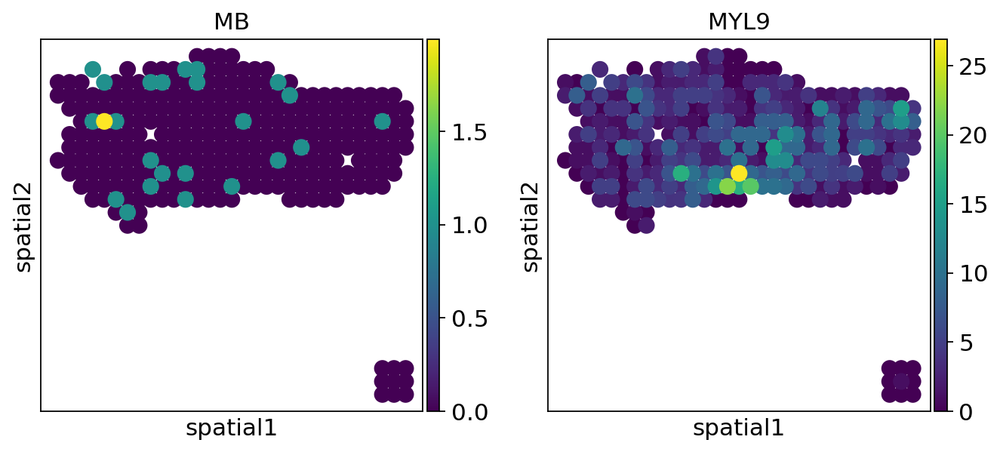

In [253]:
sc.pl.embedding(adata,basis='spatial',color=['MB','MYL9'])

In [254]:
to_save_path = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Spatial_maps/h5ad/'
to_save_file = to_save_path+data_name+'.h5ad'
adata.write(to_save_file)

# spatially resolved

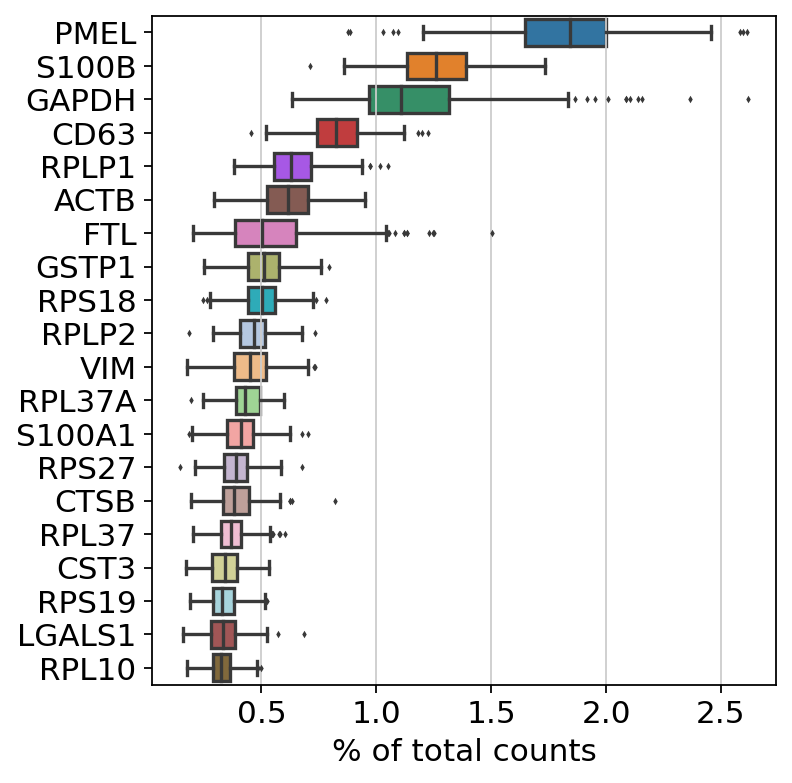

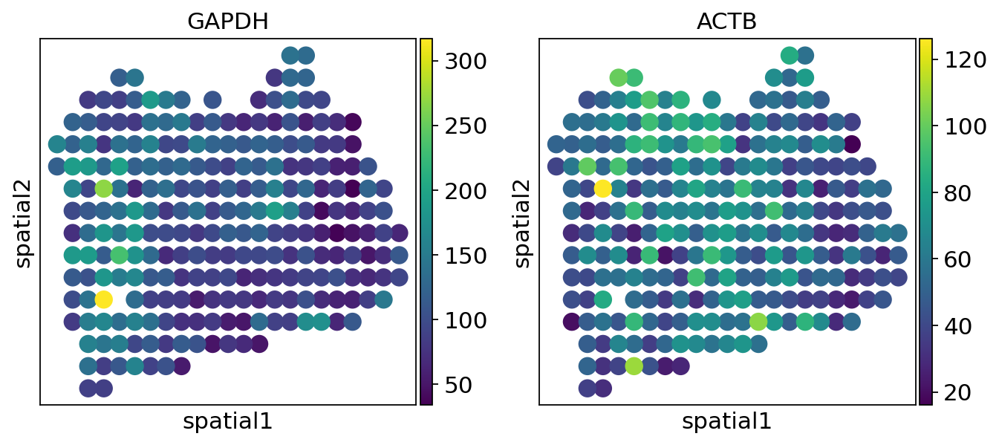

In [263]:
data_name = 'm4_r2'
path_name = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Spatially_resolved/'
# idx_name = 'Individual1_LV_R1.idx'
idx_name = data_name+'.idx'

count_name = data_name+'.count'
adata_idx = sc.read_csv(path_name+idx_name,delimiter='\t',dtype='str')
adata_count = sc.read_csv(path_name+count_name,delimiter='\t',dtype='str')


count_X = np.array(adata_count[:,adata_count.var_names[1:]].X,dtype='float')
gene_list = adata_count[:,'gene'].X[:,0]
spot_list = adata_count.var_names[1:]
obs = pd.DataFrame(index=spot_list)
var = pd.DataFrame(index=gene_list)
adata = ad.AnnData(np.transpose(count_X),  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.transpose(adata_idx.X).astype('float')

sc.pl.highest_expr_genes(adata, n_top=20, )

sc.pl.embedding(adata,basis='spatial',color=['GAPDH','ACTB'])

to_save_path = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Spatially_resolved/h5ad/'
to_save_file = to_save_path+data_name+'.h5ad'
adata.write(to_save_file)

# Visualization_and

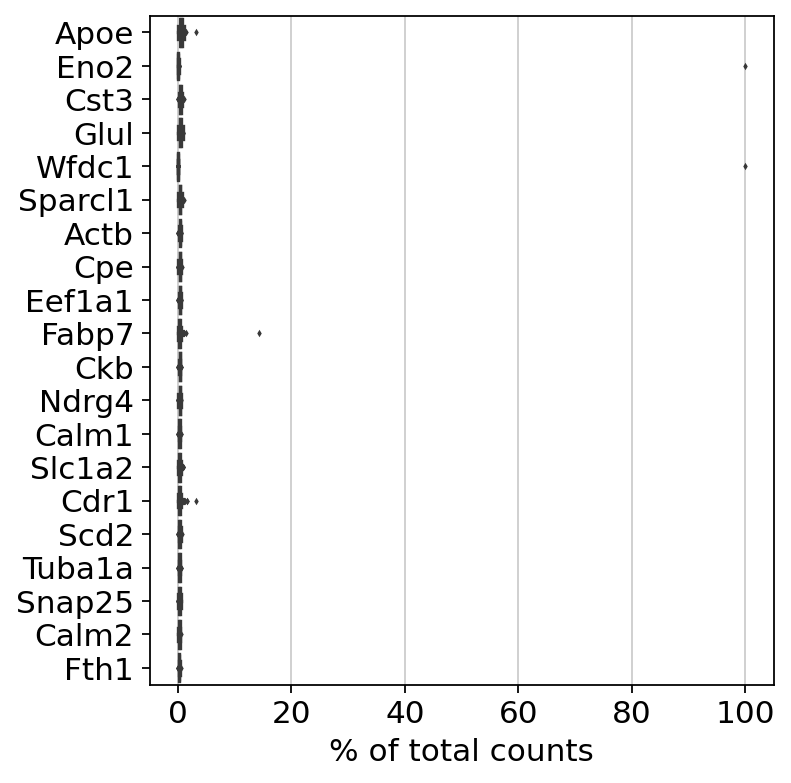

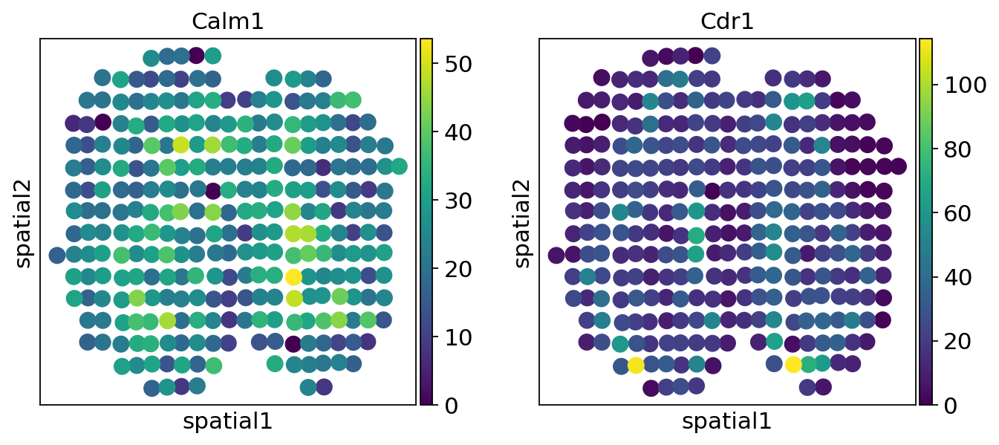

In [281]:
data_name = 'Rep12_MOB_trans'
path_name = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Visualization_and/'
# idx_name = 'Individual1_LV_R1.idx'
idx_name = data_name+'.idx'

count_name = data_name+'.tsv'
adata_idx = sc.read_csv(path_name+idx_name,delimiter='\t',dtype='str')
adata_count = sc.read_csv(path_name+count_name,delimiter='\t',dtype='str')


count_X = np.array(adata_count[:,adata_count.var_names[1:]].X,dtype='float')
gene_list = adata_count[:,'gene'].X[:,0]
spot_list = adata_count.var_names[1:]
obs = pd.DataFrame(index=spot_list)
var = pd.DataFrame(index=gene_list)
adata = ad.AnnData(np.transpose(count_X),  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.transpose(adata_idx.X).astype('float')

sc.pl.highest_expr_genes(adata, n_top=20, )

sc.pl.embedding(adata,basis='spatial',color=['Calm1','Cdr1'])

to_save_path = '/home/yzy/PUBDT/st/Spatial_transcriptomics/Visualization_and/h5ad/'
to_save_file = to_save_path+data_name+'.h5ad'
adata.write(to_save_file)

# slideseq V2

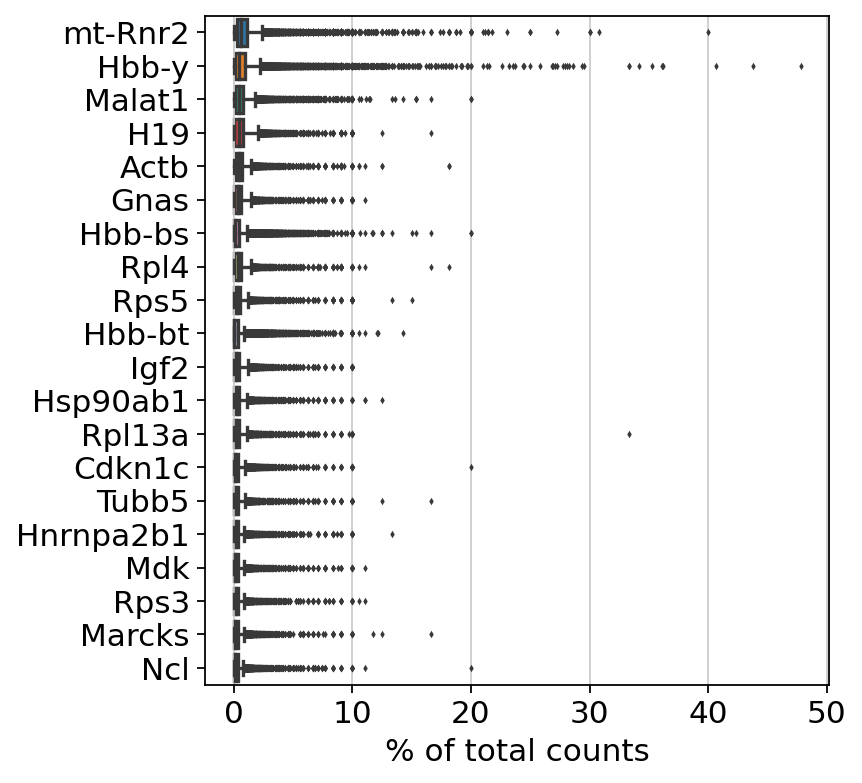

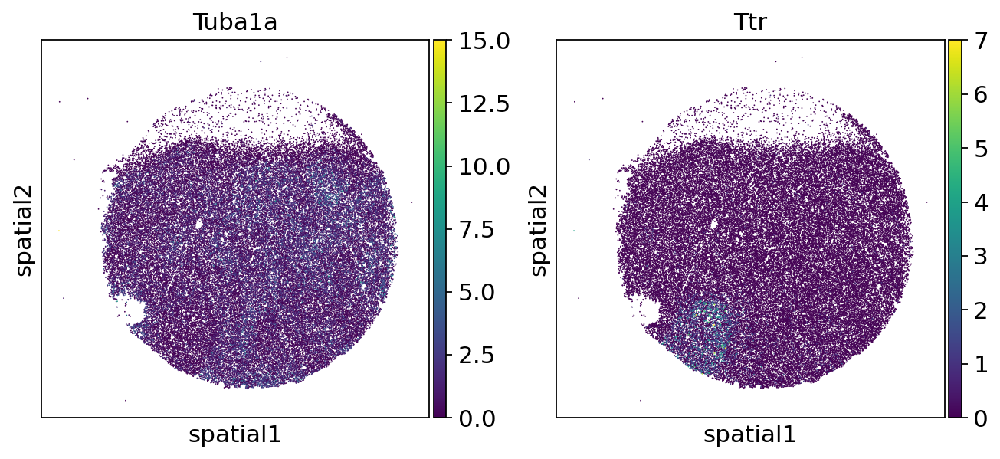

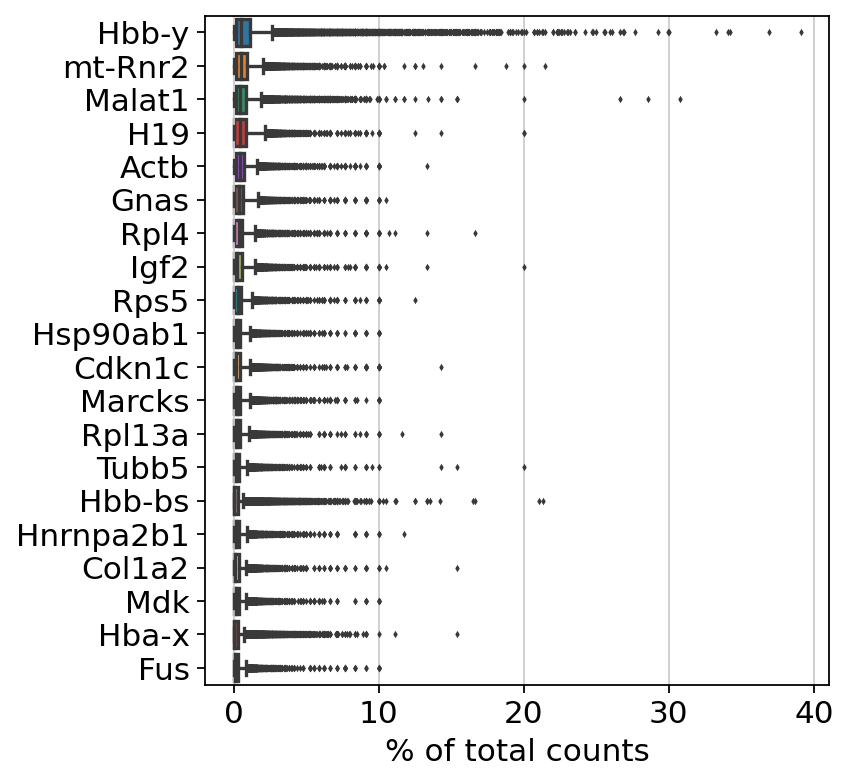

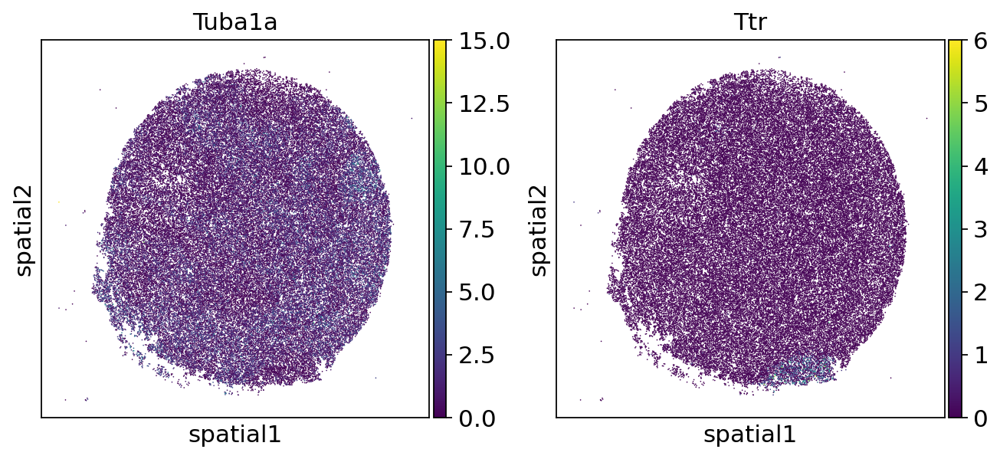

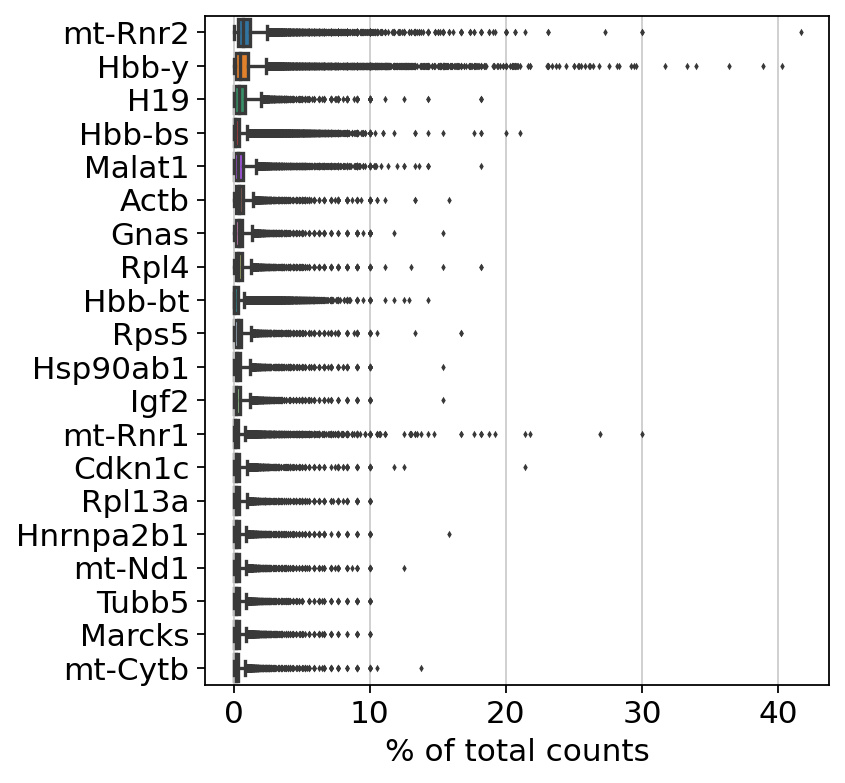

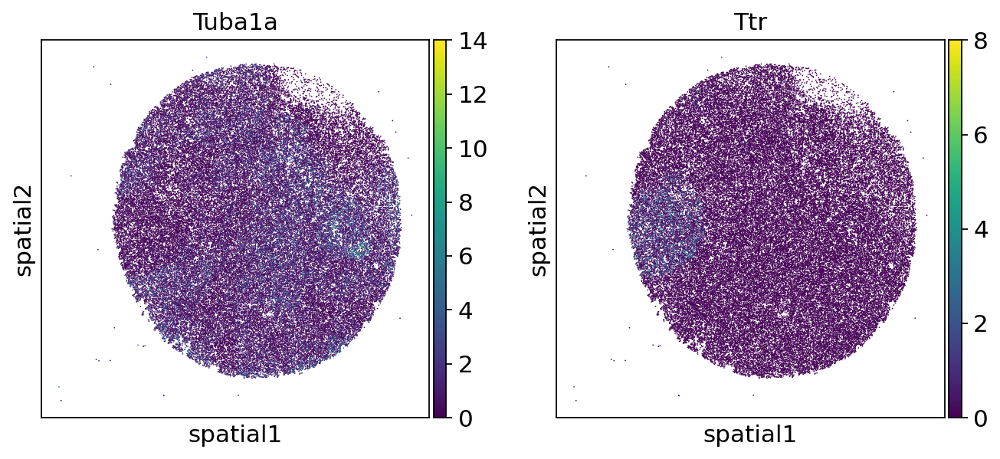

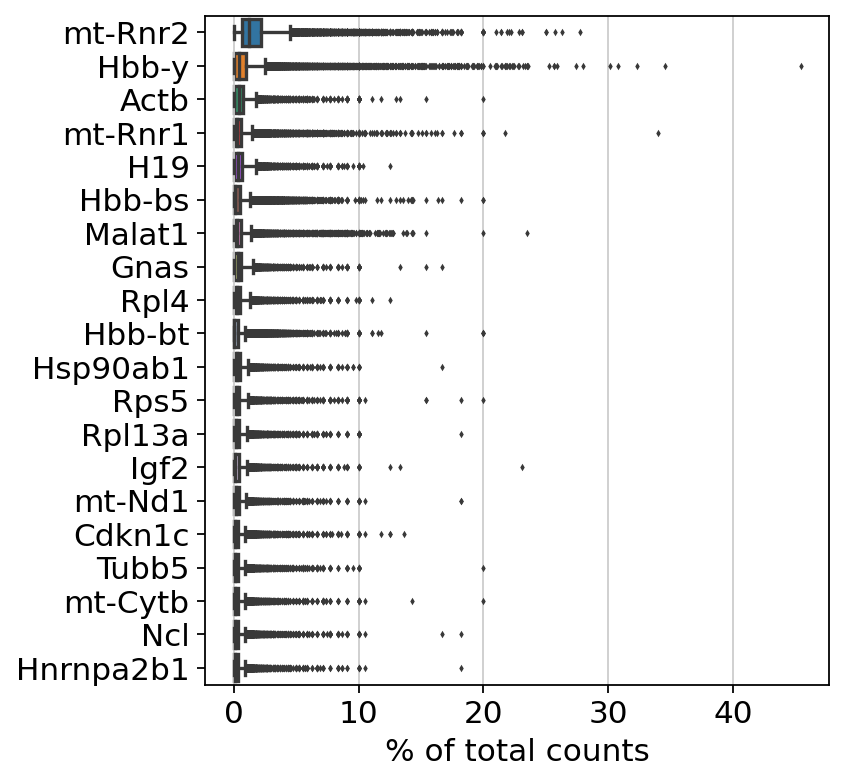

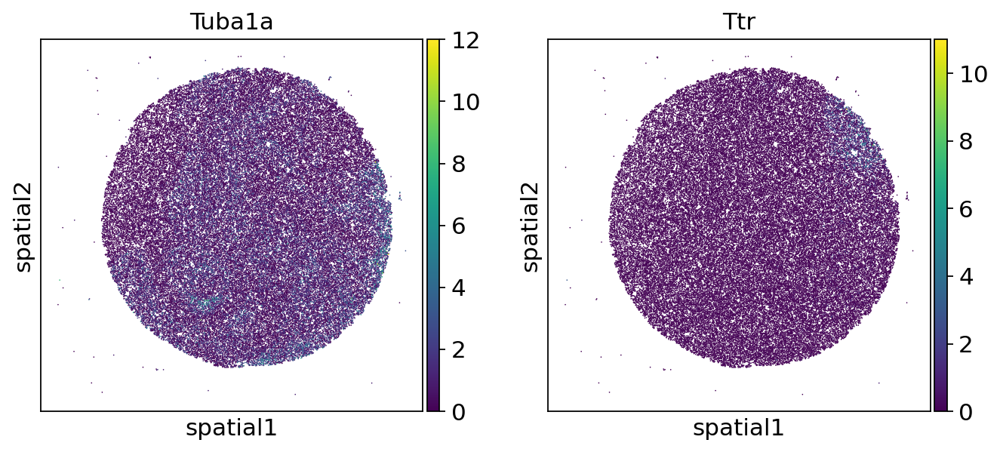

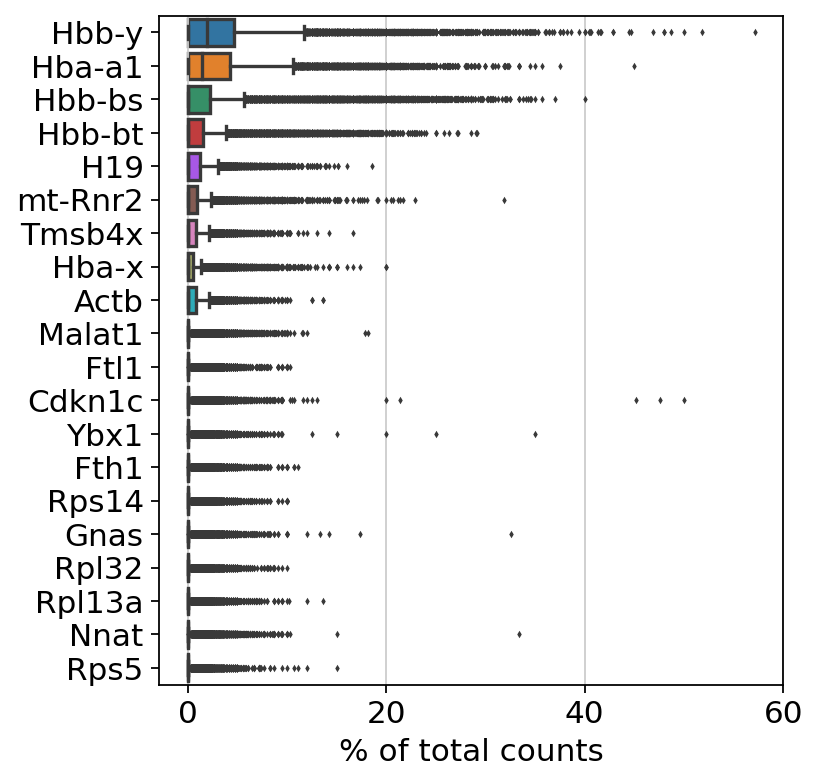

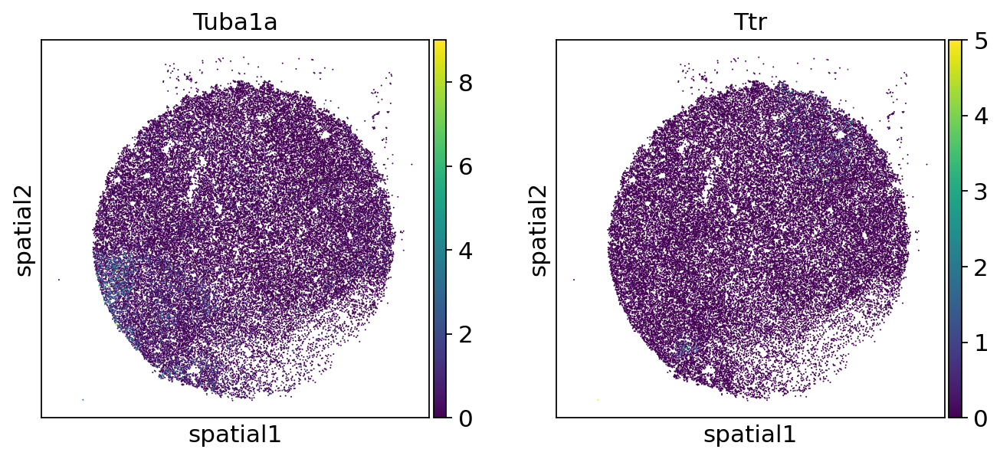

In [ ]:

data_name_list = ['Puck_190926_01','Puck_190926_02','Puck_190926_03','Puck_190926_06','Puck_191007_07',
                 'Puck_191204_01','Puck_200115_08']
for data_name in data_name_list:
#     data_name = 'Puck_190921_21'
    slideseq_root = '/home/yzy/PUBDT/st/new/Sensitive_spatial/'
    id_name = '_bead_locations.csv'
    count_name = '.digital_expression.txt'
    adata = sc.read_csv(slideseq_root+data_name+count_name,delimiter='\t').transpose()
    adata_idx = sc.read_csv(slideseq_root+data_name+id_name,delimiter=',')
    adata.obsm['spatial'] = adata_idx.X
    sc.pl.highest_expr_genes(adata, n_top=20, )
    sc.pl.embedding(adata,basis='spatial',color=['Tuba1a','Ttr'])

    to_save_path = '/home/yzy/PUBDT/st/new/Sensitive_spatial/h5ad/'
    to_save_file = to_save_path+data_name+'.h5ad'
    adata.write(to_save_file)

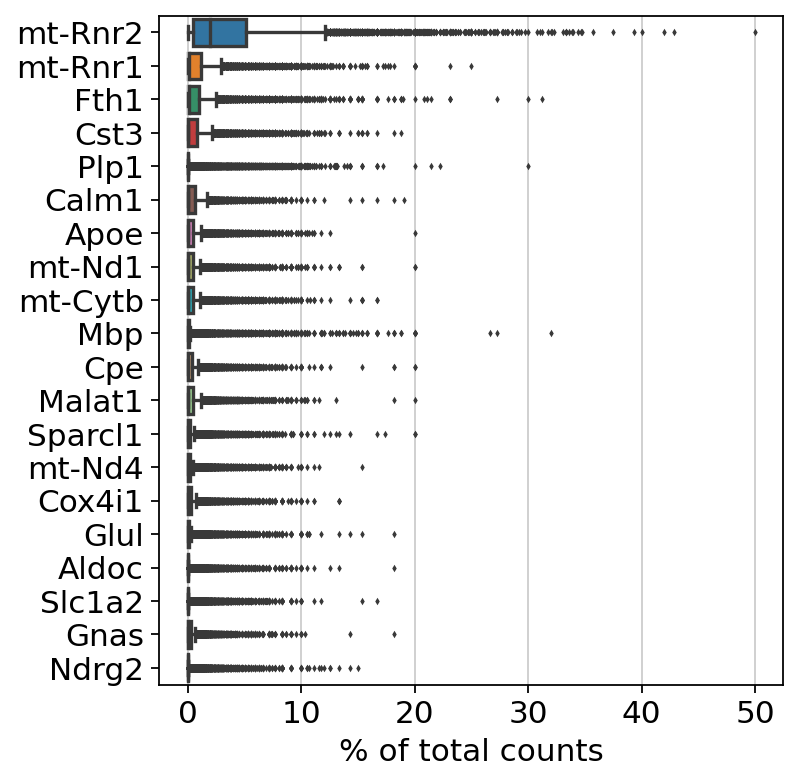

In [288]:
sc.pl.highest_expr_genes(adata, n_top=20, )


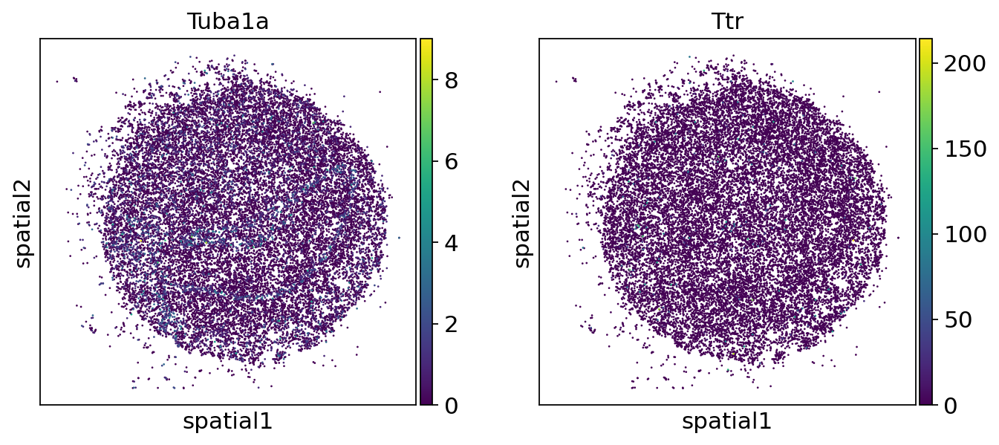

In [289]:
sc.pl.embedding(adata,basis='spatial',color=['Tuba1a','Ttr'])


In [290]:
to_save_path = '/home/yzy/PUBDT/st/new/Sensitive_spatial/h5ad/'
to_save_file = to_save_path+data_name+'.h5ad'
adata.write(to_save_file)